# Overview 

This notebook represents my playground for experimenting with concepts of Network Science, using data freely available online.  

<a href='https://en.wikipedia.org/wiki/Network_science'>Network Science</a> is not that old and maybe not that popular yet. Likely the most famous people from the field are <a href='https://en.wikipedia.org/wiki/Paul_Erd%C5%91s'>Paul Erdős</a> and, more recently, <a href='https://en.wikipedia.org/wiki/Network_science'>Albert-László Barabási</a>. 

I was introduced to Network Science through <a href='https://github.com/Big-data-course-CRI/materials_big_data_cri_2019'>this course</a> and <a href='http://networksciencebook.com/'>this book by Barabasi</a> (freely available).


## Content

[1. Short intro](#1.-Short-intro)  
[2. The dataset](#2.-The-dataset)  
[3. Network analysis](#3.-Network-analysis)  

# 1. Short intro

1. I needed a dataset to play around with some network analysis concepts that I was reading about. I read that network science is not commonly used in analysis of educational institutions / interactions in learning (except for spreading of disease in a classroom / conference / highschool etc)..

2. so I wanted to see what network science can uncover in an educational setting..

3. but it proved to be difficult to construct a network from the usual databases with education info - because it's difficult to find 'relationships' in this data. 
For example, for the World Inequality Database on Education here: https://www.education-inequalities.org/, I found it difficult to conceptualize it as relationships between actors and to construct a network.  

4. therefore, I ended up spending a lot of time going through all these databases and more 
<img src="img/network_databases.PNG" alt="" style="width: 400px;"/>

5. until I found these datasets: http://moreno.ss.uci.edu/data.html which I rezonated with a bit more.
<img src="img/jlmoreno.PNG" alt="" style="width: 400px;"/> 

# 2. The dataset
1. Dataset source: http://moreno.ss.uci.edu/data.html#adhealth

2. The data contains information about friendships of students from communities with 1 or 2 highschools / junior highs. 
Details of datasets:
    - there are 84 communities in the dataset
    - each community has between 25 and 2587 students
    - relationship data: 'friendship' , coded as intensity scale, from 0 to 15
    - nodes attributes: 
        - Sex is coded 1=male, 2=female, 0=unreported. 
        - Race is coded 1=white, 2=black, 3=hispanic, 4=asian, 5=mixed/other, 0=unreported. 
        - Grade is recorded as a number between 7 and 12 with 0=unreported. 
        - And school codes are 0 and 1 when two schools were in a single community.
        
    
## Initial dataset:
a. http://moreno.ss.uci.edu/comm4_att.dat - nodes attributes (291 students)
  
b. http://moreno.ss.uci.edu/comm4.dat - relationships (1396 edges)


## Friendship information
Friendship has a score, therefore we are dealing with a weighted network.
The relationship score is constructed as follows:

"For each friend named, the student was asked to whether he/she participated in any of five activities with the friend. These activities were:

1. you went to (his/her) house in the last seven days.
2. you met (him/her) after school to hang out or go somewhere in the last seven days.
3. you spent time with (him/her) last weekend.
4. you talked with (him/her) about a problem in the last seven days.
5. you talked with (him/her) on the telephone in the last seven days.

These activities were summed to create a valued network. Ties range in value from 1, meaning the student nominated the friend but reported no activities, to 6, meaning the student nominated the friend and reported participating in all five activities with the friend."

//mind that the data was collected in 1994-1995, therefore the communication methods mentioned in the questions might seem a bit archaic to us now.

# 3. Network analysis

### 3.1 Loading network from edgelist

Network class: Graph (undirected, no parallel edges)  
Weighted network  
Add attributes too when adding nodes to graph   

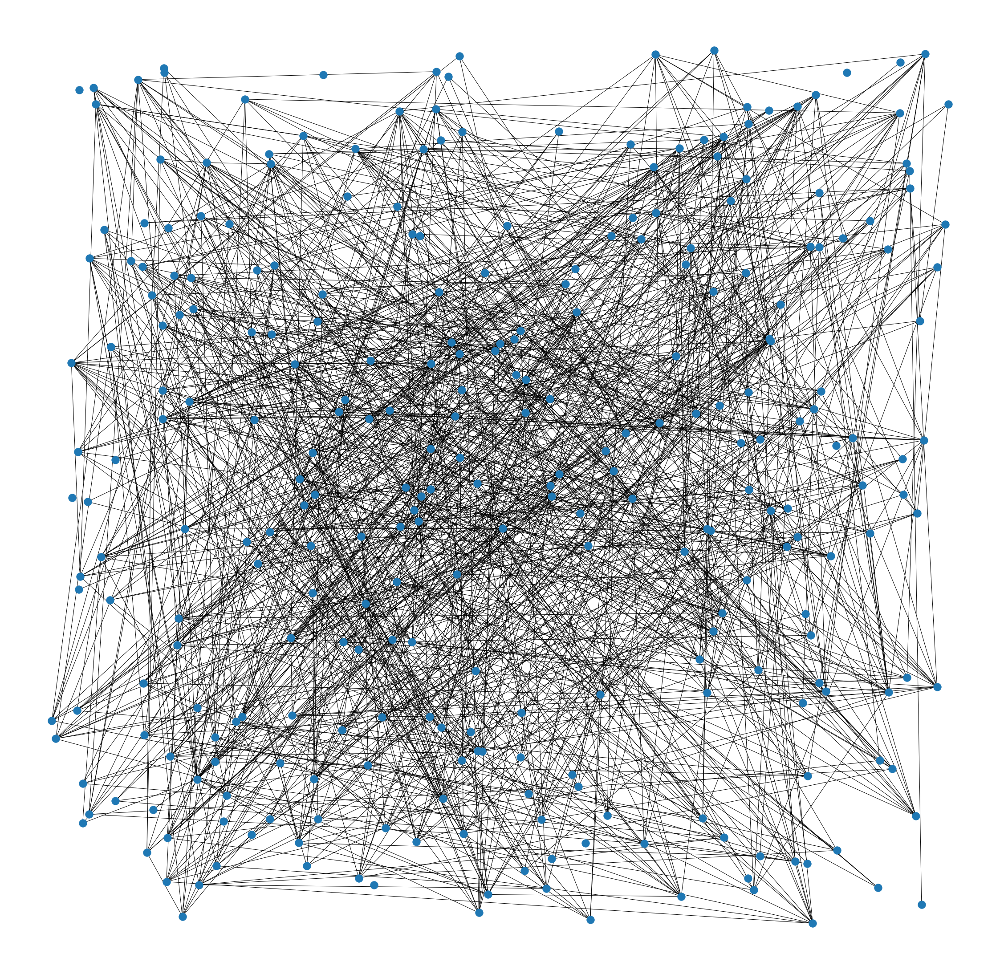

In [13]:
# load networks from file with edge list or node list 

import networkx as nx 
import csv
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

#uncomment these in case you get a file not found error. The 'current' folder might be different than what's expected
#import os
#cwd = os.getcwd()  # Get the current working directory (cwd)
#files = os.listdir(cwd)  # Get all the files in that directory
#print("Files in %r: %s" % (cwd, files))

# 0. generate a network to which we will start adding nodes and edges 

G = nx.Graph() # create an empty graph 

# 1. load network of students with relationships to other students 
with open('nodes_friendship_4.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=' ')
    next(csv_reader) #skip the header
    #line_count = 0  #only used for debugging purposes
    for row in csv_reader:
        G.add_node(row[0], sex=row[1], race=row[2], grade=row[3], school=row[4])
        #line_count += 1
    #print(f'Processed {line_count} lines.')

with open('edges_friendship_4.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=' ')
    next(csv_reader) #skip the header
    line_count = 0
    for row in csv_reader:
        G.add_edge(row[0], row[1], weight=row[2])
        G.add_edge(row[1],row[0], weight=row[2])
    
# 2. draw network   
fig, ax = plt.subplots(figsize=(40, 40))
nx.draw_random(G,with_labels = False)
plt.show()

## 3.2 Network measures: degree centrality

degree_centrality(G) = the popular students

Observation:
- very important in this kind of network: random layout instead of the default (spring) layout OR use a spring layout with adjusted elasticity
- there are very few students who are extremely popular
- most students popularity is below the average value 
- the circular layout seems to convey that the least popular students tend to interact mostly between themselves. 

<Figure size 1080x1080 with 0 Axes>

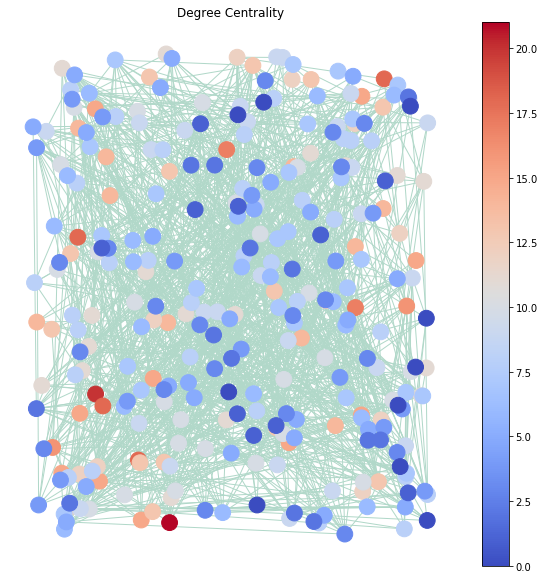

<Figure size 720x720 with 0 Axes>

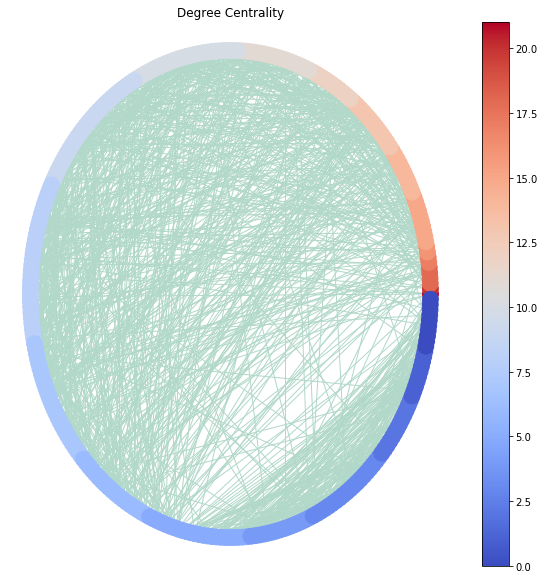

In [14]:
#compute degree centrality dictionary
deg = nx.degree_centrality(G) # gives a dictionary node: degree (scaled from 0 to 1)
degree_sequence = sorted([d for n, d in G.degree()], reverse=True) # gives array of degree values
vmin = min(degree_sequence) 
vmax = max(degree_sequence) 
cmap = plt.cm.coolwarm

# we plot network with colorbars
def draw(G, pos, measures, measure_name):
    plt.figure(figsize = (10, 10))
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, 
                                   node_color=degree_sequence,
                                   cmap=cmap, vmin=vmin, vmax=vmax)
    
    #log-scale color map, presumably for better contrast, but I don't find it helpful 
    #nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1)) 
    
    #if we draw the labels, we won't distinguish anything anymore
    #labels = nx.draw_networkx_labels(G, pos)
    
    edges = nx.draw_networkx_edges(G, pos, edge_color='#B1D8C9')

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

plt.figure(figsize = (15, 15))
#pos = nx.spring_layout(G) #test 1: the default layout 
#pos = nx.circular_layout(G) #test 2: circular 
pos = nx.random_layout(G)  #test 3: random
draw(G, pos, nx.degree_centrality(G), 'Degree Centrality')

plt.figure(figsize = (10, 10))
pos = nx.circular_layout(G) #test 2: circular 
draw(G, pos, nx.degree_centrality(G), 'Degree Centrality')

## 3.3 Network measures: betweenness centrality

<img src="betweenness.PNG" alt="" style="width: 400px;"/>

betweenness_centrality(G) = how important a student for allowing information / disease /fake news to pass from one part of the network to another. These individuals have a strategic control over the others.

Observation:
- Good news: it doesn't look like power lays in the hands of only a few individuals !

(-0.05850626612063452,
 1.0612208570810584,
 -0.05577356497615693,
 1.062566193975634)

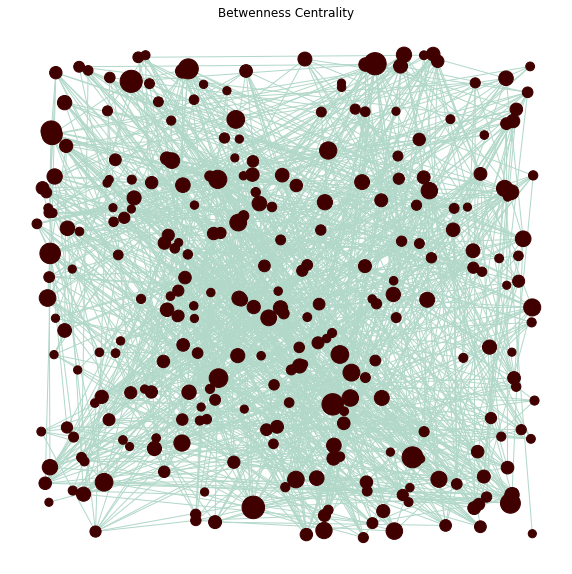

In [15]:
pos = nx.random_layout(G)
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_size =  [v * 10000 for v in betCent.values()]  # node size varies with betweenness centrality  
plt.figure(figsize = (10, 10))
nx.draw_networkx_nodes(G, pos=pos, with_labels=False,
                 node_color='#400000',
                 node_size=node_size )
nx.draw_networkx_edges(G, pos, edge_color='#B1D8C9')
plt.title('Betwenness Centrality')
plt.axis('off')

## 3.4 Network measures: closeness centrality

closeness_centrality(G) = how close a node is to all others (average of shortest path from one node to all others) = it can show us how disconnected a student is in our network

Observation: 
- Good news again: there are a few loners, but the majority seem to be doing socially fine 

(-0.047016196476577676,
 1.061786024423598,
 -0.06347327360576173,
 1.0588719873472132)

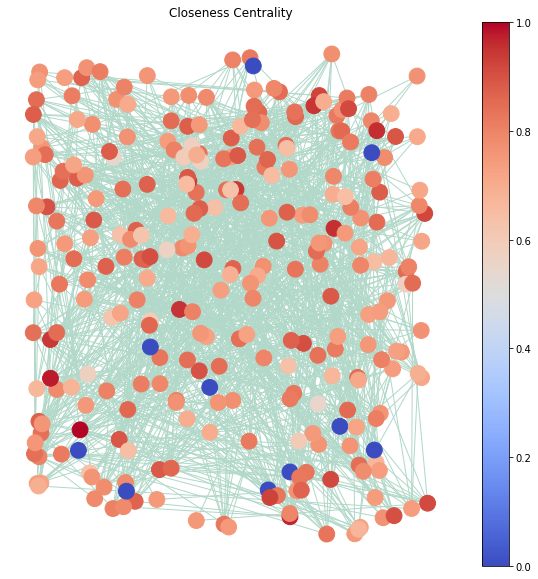

In [16]:
pos = nx.random_layout(G)
clsCent = nx.closeness_centrality(G)
factor=1.0/max(clsCent.values())
normalised_clsCent = {k: v*factor for k, v in clsCent.items()}

node_color =  [v for v in normalised_clsCent.values()]  # node size varies with betweenness centrality  
vmin = min(normalised_clsCent.values())
vmax = max(normalised_clsCent.values())
cmap = plt.cm.coolwarm

plt.figure(figsize = (10, 10))
pos = nx.random_layout(G)
nodes=nx.draw_networkx_nodes(G, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=250,
                 cmap = cmap, vmin=vmin, vmax=vmax)
nx.draw_networkx_edges(G, pos, edge_color='#B1D8C9')
plt.title('Closeness Centrality')
plt.colorbar(nodes)
plt.axis('off')

## 3.5 Network measures: eigenvector centrality

eigenverctor_centrality(G) = how connected popular students are to other popular students

Observation:
- looks very similar to degree centrality plot, therefore it is not adding any new information if we look at network level

(-0.06397648515394226,
 1.0650001464991856,
 -0.06567844642863065,
 1.063713294183383)

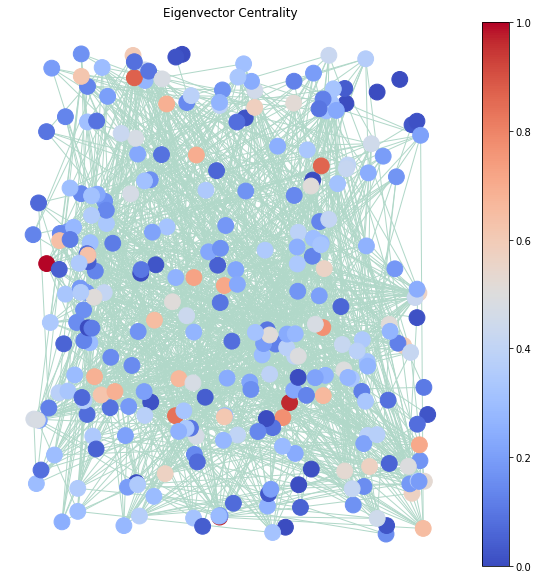

In [17]:
pos = nx.random_layout(G)
eigenCent = nx.eigenvector_centrality(G)
factor=1.0/max(eigenCent.values())
normalised_eigenCent = {k: v*factor for k, v in eigenCent.items()}
#print(normalised_clsCent)

node_color =  [v for v in normalised_eigenCent.values()]  # node size varies with betweenness centrality  
vmin = min(normalised_eigenCent.values()) 
vmax = max(normalised_eigenCent.values())
cmap = plt.cm.coolwarm

plt.figure(figsize = (10, 10))
nodes=nx.draw_networkx_nodes(G, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=250,
                 cmap = cmap, vmin=vmin, vmax=vmax)
nx.draw_networkx_edges(G, pos, edge_color='#B1D8C9')
plt.title('Eigenvector Centrality')
plt.colorbar(nodes)
plt.axis('off')

## 3.6 Histograms: network analysis with local measures

Remember network types and degree distribution:
<img src="scale-free-networks.PNG" alt="" style="width: 400px;"/>

In [18]:
import numpy as np
import seaborn

def measures_for_network(G):
    print('Network analysis with local measures')
    
    plt.figure(figsize = (30, 20))
    plt.subplot(2,2,1) 
    seaborn.distplot(list(nx.degree_centrality(G).values()), bins=20)
    plt.xlabel('normalized degree',fontsize=18) #np.max(nx.degree_centrality(G_roads).values())*
    plt.ylabel('frequency',fontsize=18)
    
    plt.subplot(2,2,2) 
    seaborn.distplot(list(nx.betweenness_centrality(G).values()), bins=20)#plt.hist(list(nx.betweenness_centrality(G).values()))
    plt.xlabel('betweenness',fontsize=18)
    plt.ylabel('frequency',fontsize=18)
    
    plt.subplot(2,2,3) 
    seaborn.distplot(list(nx.clustering(G).values()), bins=20)
    plt.xlabel('clustering',fontsize=18)
    plt.ylabel('frequency',fontsize=18)
    
    plt.subplot(2,2,4) 
    plt.hist(list(nx.closeness_centrality(G).values()), bins=20)
    plt.xlabel('closeness',fontsize=18)
    plt.ylabel('frequency',fontsize=18)
    plt.show()
    

Network analysis with local measures


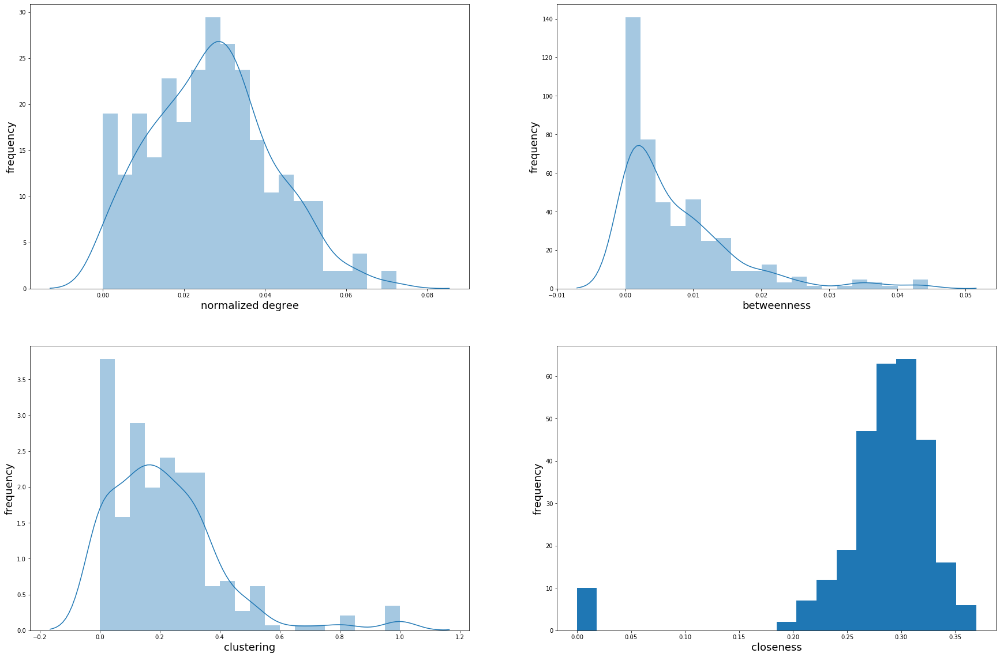

In [19]:
%matplotlib inline
#from networkx.algorithms.community import greedy_modularity_communities

measures_for_network(G)

## 3.7 Continuing the analysis into nodes attributes 

Node attributes:  
    - id / sex / race / grade / school  
    - remember encoding:  
        - sex is 1=male, 2=female  
        - race is coded 1=white, 2=black, 3=hispanic, 4=asian, 5=mixed/other, 0=unreported.   
    
 
### Q1: How well is race represented in our data ?
 
### Q2: How well is gender represented in our data ?

Text(0, 0.5, 'number of same-race edges')

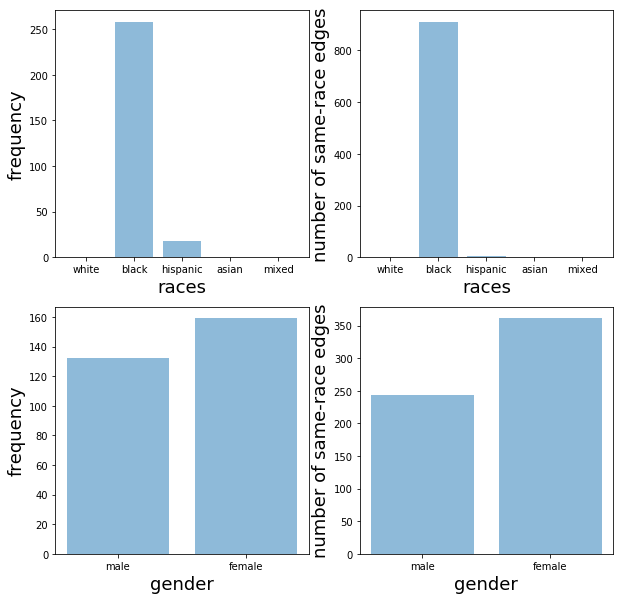

In [20]:
male = '1'
female = '2'
male_students = list()
female_students = list()

white = '1'
black = '2'
hispanic = '3'
asian = '4'
mixed_other = '5'
white_students = list()
black_students = list()
hispanic_students = list()
asian_students = list()
mixed_other_students = list()

with open('nodes_friendship_4.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=' ')
    next(csv_reader) #skip the header
    line_count = 0
    for row in csv_reader:
        if (row[1]==male):
            male_students.append(row[0])
        if (row[1]==female):
            female_students.append(row[0]) 
        if (row[2]==white):
            white_students.append(row[0])
        if (row[2]==black):
            black_students.append(row[0])    
        if (row[2]==hispanic):
            hispanic_students.append(row[0])      
        if (row[2]==asian):
            asian_students.append(row[0]) 
        if (row[2]==mixed_other):
            mixed_other_students.append(row[0])     
#print(f'Male students: {male_studens}')
#print(f'Female students: {female_studens}')

#sex
mG = G.subgraph(male_students)
fG = G.subgraph(female_students)

#race
wG = G.subgraph(white_students).copy()
bG = G.subgraph(black_students).copy()
hG = G.subgraph(hispanic_students).copy()
aG = G.subgraph(asian_students).copy()
oG = G.subgraph(asian_students).copy()

racial_representation = list()
racial_representation.append(len(wG.nodes))
racial_representation.append(len(bG.nodes))
racial_representation.append(len(hG.nodes))
racial_representation.append(len(aG.nodes))
racial_representation.append(len(oG.nodes))
#print(racial_representation)
#plt.hist(racial_representation, bins=5)

racial_representation_edges = list()
racial_representation_edges.append(len(wG.edges))
racial_representation_edges.append(len(bG.edges))
racial_representation_edges.append(len(hG.edges))
racial_representation_edges.append(len(aG.edges))
racial_representation_edges.append(len(oG.edges))

plt.figure(figsize = (10, 10))

plt.subplot(2,2,1)
y_pos = ['white', 'black', 'hispanic', 'asian', 'mixed']
plt.bar(y_pos, racial_representation, align='center', alpha=0.5)
plt.xlabel('races',fontsize=18)
plt.ylabel('frequency',fontsize=18)

plt.subplot(2,2,2)
y_pos = ['white', 'black', 'hispanic', 'asian', 'mixed']
plt.bar(y_pos, racial_representation_edges, align='center', alpha=0.5)
plt.xlabel('races',fontsize=18)
plt.ylabel('number of same-race edges',fontsize=18)

gender_representation = list();
gender_representation.append(len(mG.nodes))
gender_representation.append(len(fG.nodes))
plt.subplot(2,2,3)
y_pos = ['male', 'female']
plt.bar(y_pos, gender_representation, align='center', alpha=0.5)
plt.xlabel('gender',fontsize=18)
plt.ylabel('frequency',fontsize=18)

gender_representation_edges = list();
gender_representation_edges.append(len(mG.edges))
gender_representation_edges.append(len(fG.edges))
plt.subplot(2,2,4)
y_pos = ['male', 'female']
plt.bar(y_pos, gender_representation_edges, align='center', alpha=0.5)
plt.xlabel('gender',fontsize=18)
plt.ylabel('number of same-race edges',fontsize=18)

## 3.8 Degree centrality in male vs female friendship networks

<Figure size 360x360 with 0 Axes>

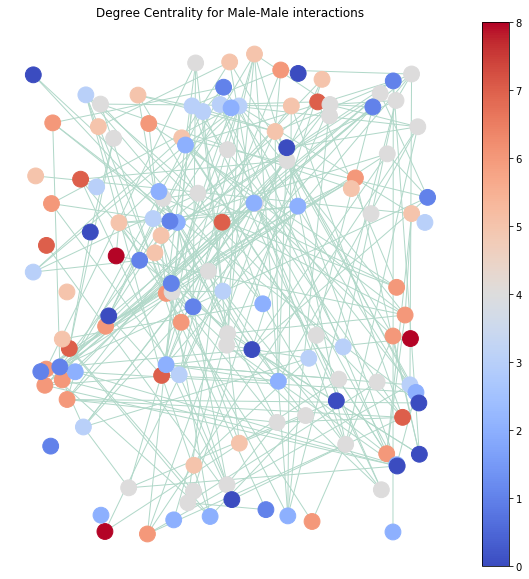

<Figure size 360x360 with 0 Axes>

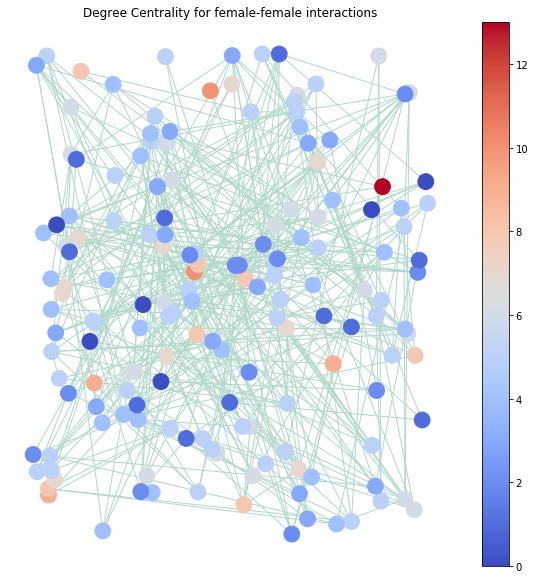

In [21]:
#compute degree centrality dictionary
deg = nx.degree_centrality(mG) # gives a dictionary node: degree (scaled from 0 to 1)
degree_sequence = sorted([d for n, d in mG.degree()], reverse=True) # gives array of degree values
vmin = min(degree_sequence) 
vmax = max(degree_sequence) 
cmap = plt.cm.coolwarm

# we plot network with colorbars
def draw(mG, pos, measures, measure_name):
    plt.figure(figsize = (10, 10))
    nodes = nx.draw_networkx_nodes(mG, pos, node_size=250, 
                                   node_color=degree_sequence,
                                   cmap=cmap, vmin=vmin, vmax=vmax)
    edges = nx.draw_networkx_edges(mG, pos, edge_color='#B1D8C9')

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

plt.figure(figsize = (5, 5))
pos = nx.random_layout(mG)  #test 3: random
draw(mG, pos, nx.degree_centrality(mG), 'Degree Centrality for Male-Male interactions')

#compute degree centrality dictionary
deg = nx.degree_centrality(fG) # gives a dictionary node: degree (scaled from 0 to 1)
degree_sequence = sorted([d for n, d in fG.degree()], reverse=True) # gives array of degree values
vmin = min(degree_sequence) 
vmax = max(degree_sequence) 
cmap = plt.cm.coolwarm
plt.figure(figsize = (5, 5))
pos = nx.random_layout(fG)  #test 3: random
draw(fG, pos, nx.degree_centrality(fG), 'Degree Centrality for female-female interactions')
plt.show()

## 3.9 Betweenness centrality in male vs female friendship networks

(-0.06408774914489115,
 1.0531502864650857,
 -0.05711841085168807,
 1.0479248961985694)

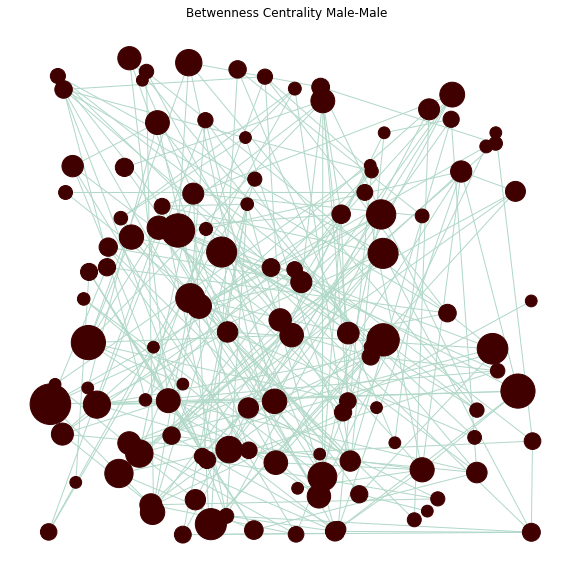

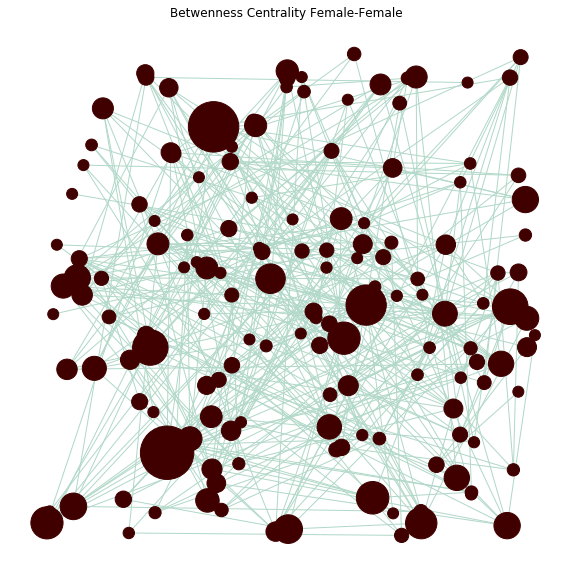

In [22]:
pos = nx.random_layout(mG)
betCent = nx.betweenness_centrality(mG, normalized=True, endpoints=True)
node_size =  [v * 10000 for v in betCent.values()]  # node size varies with betweenness centrality  
plt.figure(figsize = (10, 10))
nx.draw_networkx_nodes(mG, pos=pos, with_labels=False,
                 node_color='#400000',
                 node_size=node_size )
nx.draw_networkx_edges(mG, pos, edge_color='#B1D8C9')
plt.title('Betwenness Centrality Male-Male')
plt.axis('off')

pos = nx.random_layout(fG)
betCent = nx.betweenness_centrality(fG, normalized=True, endpoints=True)
node_size =  [v * 10000 for v in betCent.values()]  # node size varies with betweenness centrality  
plt.figure(figsize = (10, 10))
nx.draw_networkx_nodes(fG, pos=pos, with_labels=False,
                 node_color='#400000',
                 node_size=node_size )
nx.draw_networkx_edges(fG, pos, edge_color='#B1D8C9')
plt.title('Betwenness Centrality Female-Female')
plt.axis('off')